In [1]:
import os
import logging
import pickle
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import patches as mpatches

In [14]:
from cube_fil_finder.util import moments
from cube_fil_finder.galfa import galfa_const
from cube_fil_finder.galfa import galfa_util
from cube_fil_finder.vis import node_vis
from cube_fil_finder.util import cube_moments
from cube_fil_finder.util import cube_util
from cube_fil_finder.util import widths

In [3]:
from astropy.io import fits
from astropy import units as u

In [4]:
# example header
hdr = fits.getheader('/Volumes/LarryExternal1/Research_2017/GALFA_slices_backup/umask_gaussian_30/GALFA_HI_W_S0955_V-050.4kms_umask.fits')

In [5]:
%matplotlib inline

In [6]:
logging.getLogger().setLevel('DEBUG')

In [5]:
all_trees_pickle = '../../pickled_dicts/fifth_batch/all_trees.p'
assert os.path.exists(all_trees_pickle)

In [6]:
with open(all_trees_pickle, 'rb') as f:
    all_trees = pickle.load(f)

In [7]:
logging.info('total number of trees (unfiltered): {}'.format(len(all_trees)))

INFO:root:total number of trees (unfiltered): 63270


### length distribution 

##### very long trees

In [11]:
length_cutoff = 54
logging.info('trees with length >= {0}: {1}'
             .format(length_cutoff, [k for k, v in all_trees.items() if v.length >= length_cutoff]))

INFO:root:trees with length >= 54: ['32300_955_0']


In [12]:
ex_long_tree = all_trees['32300_955_0']

In [13]:
ex_long_tree.getTreeMaskSize2D()

125184

In [14]:
ex_long_tree.getTreeMaskedArea2D()

32778

In [15]:
ex_long_tree.getTreeAspectRatio()

1.177914110429448

In [87]:
moments.get_tree_mask_orientation_info(ex_long_tree)

(4675, 209, -0.6032479026472641, 0.9675484241476324, 0.36793198524224857)

### tree roundness filtering

##### tree roundness calculation

In [15]:
all_trees_mask_orientation_info_pickle = '../../pickled_dicts/fifth_batch/all_trees_mask_orientation_info.p'

In [16]:
# all_trees_mask_orientation_info = {k: moments.get_tree_mask_orientation_info(v) for k, v in all_trees.items()}
# pickle.dump(all_trees_mask_orientation_info, open(all_trees_mask_orientation_info_pickle, 'wb'))

In [17]:
assert os.path.exists(all_trees_mask_orientation_info_pickle)
with open(all_trees_mask_orientation_info_pickle, 'rb') as f:
    all_trees_mask_orientation_info = pickle.load(f)

#### cuts of ~1:6, ~1:8, and ~1:10

In [33]:
all_tree_lengths = np.asarray([v.length for k, v in all_trees.items()])

In [66]:
tree_lengths = {'all': all_tree_lengths}

for ar in ['1:6', '1:8', '1:10', '1:12']:
    roundness_cutoff = moments.ROUNDNESS_AR_CONVERSION[ar.replace(':', '_')]
    filtered_trees = {
        tree_key: all_trees[tree_key]
        for tree_key in [k 
                         for k, v in all_trees_mask_orientation_info.items()
                         if v[-1] <= roundness_cutoff]
    }
    
    logging.info('total number of trees (filtered at ~{1} aspect ratio): {0}'.format(len(filtered_trees), ar))
    filtered_tree_lengths = np.asarray([v.length for k, v in filtered_trees.items()])
    logging.info('tree lengths (filtered at ~{5} aspect ratio) stats: min={0}, max={1}, mean={2}, med={3}, std={4}'
                 .format(filtered_tree_lengths.min(),
                         filtered_tree_lengths.max(),
                         filtered_tree_lengths.mean(),
                         np.median(filtered_tree_lengths),
                         filtered_tree_lengths.std(),
                         ar))
    tree_lengths[ar] = filtered_tree_lengths

INFO:root:total number of trees (filtered at ~1:6 aspect ratio): 3496
INFO:root:tree lengths (filtered at ~1:6 aspect ratio) stats: min=2, max=28, mean=2.90789473684, med=2.0, std=1.67823103662
INFO:root:total number of trees (filtered at ~1:8 aspect ratio): 1101
INFO:root:tree lengths (filtered at ~1:8 aspect ratio) stats: min=2, max=22, mean=2.83469573115, med=2.0, std=1.51166058761
INFO:root:total number of trees (filtered at ~1:10 aspect ratio): 374
INFO:root:tree lengths (filtered at ~1:10 aspect ratio) stats: min=2, max=22, mean=2.7513368984, med=2.0, std=1.5903068109
INFO:root:total number of trees (filtered at ~1:12 aspect ratio): 142
INFO:root:tree lengths (filtered at ~1:12 aspect ratio) stats: min=2, max=22, mean=2.90845070423, med=2.0, std=2.010202602


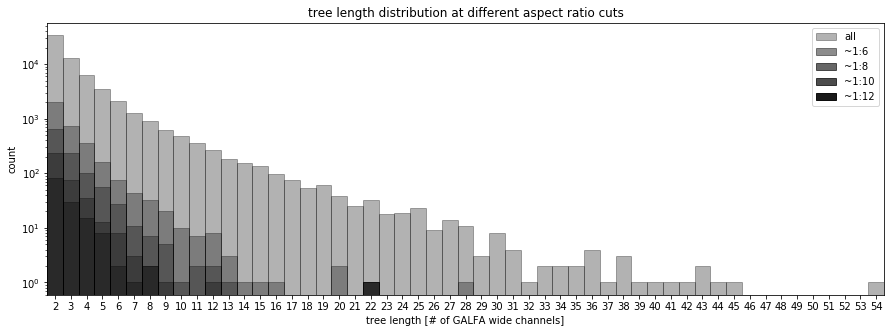

In [67]:
fig_length_hist, ax_length_hist = plt.subplots(figsize=(15,5))

bins = np.arange(1.5, 55, 1)
for group, lengths in tree_lengths.items():
    hist_tup = ax_length_hist.hist(lengths, bins=bins, edgecolor='black', color='black', alpha=.3)
ax_length_hist.set_yscale('log')
ax_length_hist.set_xlim(bins.min(), bins.max())
ax_length_hist.set_xticks(np.arange(2, 55, 1))
ax_length_hist.set_xlabel('tree length [# of GALFA wide channels]')
ax_length_hist.set_ylabel('count')

patches = []
patches.append(mpatches.Patch(color='black', label='all', alpha=.3))
patches.append(mpatches.Patch(color='black', label='~1:6', alpha=.45))
patches.append(mpatches.Patch(color='black', label='~1:8', alpha=.6))
patches.append(mpatches.Patch(color='black', label='~1:10', alpha=.7))
patches.append(mpatches.Patch(color='black', label='~1:12', alpha=.9))

ax_length_hist.legend(handles=patches)

fig_length_hist.tight_layout = True
ax_length_hist.set_title('tree length distribution at different aspect ratio cuts')
fig_length_hist.show()

### baseline ~1:6  cut

In [7]:
filtered_trees_1_6_pickle = '../../pickled_dicts/fifth_batch/filtered_trees_1_6.p'

In [8]:
# filtered_trees_1_6 = {
#     tree_key: all_trees[tree_key]
#     for tree_key in [k for k, v in all_trees_mask_orientation_info.items()
#                      if v[-1] <= moments.ROUNDNESS_AR_CONVERSION['1_6']]
# }
# pickle.dump(filtered_trees_1_6, open(filtered_trees_1_6_pickle, 'wb'))

In [9]:
with open(filtered_trees_1_6_pickle, 'rb') as f:
    filtered_trees_1_6 = pickle.load(f)

In [10]:
len(filtered_trees_1_6)

3496

In [18]:
trees_data_1_6 = {}

In [19]:
do_column_plots = False

DEBUG:root:on key: 947_1049_0
INFO:root:(0 out of 3496 done)
DEBUG:root:doing gaussian umask filter
/Users/larryli/Documents/CC/16-17/research/3d_filfind/cube_fil_finder/util/cube_moments.py:73: RuntimeWarning: invalid value encountered in divide
  moment_1_map = moment_1_map * galfa_const.GALFA_W_SLICE_SEPARATION / moment_0_map
/Users/larryli/anaconda/envs/py27research/lib/python2.7/site-packages/fil_finder/filfinder2D.py:289: UserWarning: Using inputted mask. Skipping creation of anew mask.
  warnings.warn("Using inputted mask. Skipping creation of a"
DEBUG:root:on key: 1104_1028_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 477_1023_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 407_1027_11
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 934_1016_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 802_1016_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2131_995_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 608_1

DEBUG:root:on key: 1815_1021_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 758_1021_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1031_1008_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1521_1067_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3068_992_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3785_980_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1321_1044_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1723_1032_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1003_1010_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 459_1037_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1599_971_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1759_1010_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2383_1015_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1657_1025_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1831_9

DEBUG:root:on key: 3482_1033_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3632_1032_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 694_979_6
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2046_1021_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1343_1036_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4085_1029_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4106_956_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2938_1014_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1359_998_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 523_1019_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1243_1078_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 404_1007_15
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3881_1020_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 5273_965_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 396_102

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1300_989_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 592_1015_10
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3385_1036_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1889_1014_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 803_1022_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1767_1011_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1567_994_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2717_1009_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 576_970_7
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 825_1021_8
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4909_959_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4989_1021_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 649_1028_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1444_1019_0
DEBUG:root:doing gaussian um

DEBUG:root:on key: 3773_1019_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 704_1023_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2492_1024_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1405_988_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 666_1007_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3034_1024_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 459_1026_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 7852_1027_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1141_1043_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1141_1043_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2442_1037_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 986_1040_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 838_1047_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1906_1065_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 644_969

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1733_986_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4725_1018_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 5001_1031_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1736_1024_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1472_1009_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4364_999_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2279_1054_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 873_1048_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1877_1013_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 437_1022_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 968_1018_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 526_1011_11
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2088_1008_0
DEBUG:root:skipping b/c 2088_1008_0 is too close to the edge
DEBUG:root:on key: 2202_968_0
DEBU

DEBUG:root:on key: 3684_1025_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3723_1022_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 496_1035_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 460_986_12
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2056_1027_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3218_1041_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1921_1031_0
DEBUG:root:skipping b/c 1921_1031_0 is too close to the edge
DEBUG:root:on key: 4351_1024_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 460_1030_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 583_1006_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1872_1012_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 993_1052_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1152_1010_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 707_1016_8
INFO:root:(700 out of 3496 done)
DEBUG:root

DEBUG:root:on key: 382_997_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 592_991_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 970_1038_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 740_1012_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 705_1003_6
DEBUG:root:skipping b/c 705_1003_6 is too close to the edge
DEBUG:root:on key: 1473_1024_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2705_1059_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1206_1026_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 931_999_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1204_1014_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1388_1027_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3515_1028_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2900_1032_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2945_1028_0
DEBUG:root:doing gaussian umask filter
DEBUG:ro

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2641_1036_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2750_1018_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2554_1031_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1688_992_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 5118_1023_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1771_977_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1394_960_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 774_1000_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 976_1030_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1591_969_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 800_1010_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 397_1003_12
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4208_1013_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1366_1028_1
DEBUG:root:doing gaussian u

DEBUG:root:on key: 2256_1035_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1192_1024_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1151_1012_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 595_1035_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 905_1038_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2188_1032_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1551_1019_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2929_1064_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1729_1022_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3265_958_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 476_1015_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2862_1030_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 378_1027_11
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 949_1039_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1157_1

DEBUG:root:on key: 467_1024_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 907_982_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1035_1052_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1110_1041_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 435_1015_6
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1656_1014_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1240_1006_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 424_1013_15
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1072_1032_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 780_1026_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 925_1024_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 967_1027_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1442_1008_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 644_1005_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1035_1059

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2640_1034_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 385_1034_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 5170_1036_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1180_1000_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 448_1018_16
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 5962_989_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2510_981_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2681_1072_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1190_967_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 676_1021_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 405_1034_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1586_1001_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 738_1017_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 971_1031_0
DEBUG:root:doing gaussian um

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 588_1021_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 989_999_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2809_1013_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3253_1030_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 7339_1012_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3739_1080_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 6152_1043_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2060_1057_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 401_1014_6
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1945_1027_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 672_1022_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2125_1017_1
INFO:root:(1400 out of 3496 done)
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1582_1025_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 303

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1850_961_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 599_1023_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 542_1015_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1058_1028_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2359_1026_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3872_1027_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 593_1015_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 899_1011_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1614_999_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2651_1026_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1280_992_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 378_1014_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1457_1030_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1002_1014_2
DEBUG:root:doing gaussian um

DEBUG:root:on key: 2665_1012_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 679_1024_8
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1304_1039_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1096_1024_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1010_1007_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 715_1036_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 989_1009_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 640_993_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3357_1073_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 985_1006_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 985_1025_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 667_1016_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 632_1012_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1142_1061_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 810_1021_0

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2654_1020_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 413_1025_10
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3713_1001_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 670_991_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 407_1024_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1037_1006_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2332_1031_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 511_989_17
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 7929_1043_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1094_1030_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 738_1027_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 395_1016_10
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3959_1011_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3945_1015_0
DEBUG:root:doing gaussian

DEBUG:root:on key: 3235_1070_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4040_1019_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 523_1015_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1700_1012_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 600_1023_7
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4565_1001_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 683_1030_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3163_1027_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3455_1033_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1360_1014_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1663_1022_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1897_1013_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4125_1023_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 461_1016_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 429_1

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3589_1017_0
DEBUG:root:skipping b/c 3589_1017_0 is too close to the edge
DEBUG:root:on key: 830_1042_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3001_989_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1234_1018_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4557_1016_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 839_1023_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1237_1016_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 703_963_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 402_1010_10
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 7161_1016_0
DEBUG:root:skipping b/c 7161_1016_0 is too close to the edge
DEBUG:root:on key: 634_1017_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1940_1026_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1825_1018_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2014_1023_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1276_1016_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 584_1016_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 792_1009_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 456_1029_22
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 755_1028_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2079_999_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 892_1039_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4050_1023_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1929_1028_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 584_1010_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1205_1042_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 395_1021_23
INFO:root:(2100 out of 3496 done)
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1963

DEBUG:root:on key: 2422_1042_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 795_1025_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 881_1021_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1211_1031_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 563_1031_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2819_1031_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2819_1031_1
DEBUG:root:skipping b/c 2819_1031_1 is too close to the edge
DEBUG:root:on key: 919_1051_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2513_1009_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1854_1022_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1626_1017_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 5865_1023_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 756_1035_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3385_1037_0
DEBUG:root:doing gaussian umask filter
DEB

DEBUG:root:on key: 1504_1073_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 857_1066_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1445_1021_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 931_1032_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1586_1021_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 480_1023_12
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 810_972_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 531_1070_6
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1317_1025_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1958_1041_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1141_1040_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3123_1022_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 675_971_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2469_978_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2610_1007

DEBUG:root:on key: 1067_1026_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2060_1038_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1548_1028_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1142_1024_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 955_1000_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3410_1026_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1844_1024_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 758_1036_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 845_1022_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2236_1001_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 510_1019_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1957_1031_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4430_984_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1411_1022_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1066_1

DEBUG:root:on key: 2347_1018_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3875_1014_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 537_975_8
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 531_1021_6
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1785_1023_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 14544_999_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1386_1003_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 407_1019_11
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 5645_1021_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1689_1035_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4417_1015_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 5339_1043_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1381_1023_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 478_1022_6
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1875_

DEBUG:root:on key: 480_1034_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 761_974_6
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1401_1023_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4769_1020_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2698_1037_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1006_1027_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3584_1025_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1734_1022_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 6137_1025_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 466_1027_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 578_1017_10
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 517_1027_9
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1478_1025_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 498_1036_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1487_99

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3671_1009_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 865_1025_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 4247_1017_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 746_1040_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 799_989_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1499_1016_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1670_985_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1545_1015_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1164_1010_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 460_1027_8
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 678_1039_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2214_1036_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2401_1000_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 487_969_1
DEBUG:root:doing gaussian uma

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1729_1024_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 921_1025_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 474_1018_10
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2730_1059_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 621_1040_8
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1112_1031_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1325_1026_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2560_1023_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1292_990_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1120_1007_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 891_1030_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 883_1010_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1288_1025_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1797_988_0
DEBUG:root:doing gaussian 

DEBUG:root:on key: 920_1019_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 538_1016_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1157_1038_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 6387_1024_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2326_1029_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1208_1013_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1822_1005_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 666_1021_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 387_1014_20
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 468_1023_11
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 738_1022_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 6793_1019_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1350_1029_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1436_1015_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3135_

DEBUG:root:on key: 1863_1029_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1548_1026_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 8778_1014_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 873_1035_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 526_999_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 5915_1025_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3196_1032_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 686_976_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 842_1004_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1807_986_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2883_1023_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2906_1037_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1536_1040_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2089_1055_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1964_103

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1786_1051_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2271_1009_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 869_1036_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 400_965_23
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1198_1040_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 15130_1033_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 859_1000_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2302_1050_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 385_1008_17
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 396_1039_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 797_1021_4
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1012_1026_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 648_1006_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1783_965_0
DEBUG:root:doing gaussian 

DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 551_1064_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 556_1048_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1098_1026_3
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 647_1015_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1889_1029_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 888_1026_2
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2691_1010_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1051_1041_1
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 567_1067_8
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 413_980_20
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3135_1033_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 764_1018_7
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 990_1028_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3140_1020_0
DEBUG:root:doing gaussian um

DEBUG:root:on key: 736_980_6
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 453_1025_9
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1700_1013_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 446_975_5
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1731_1054_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 3829_1024_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 524_1011_9
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 438_990_11
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 2718_1031_0
DEBUG:root:doing gaussian umask filter
DEBUG:root:on key: 1371_1026_3
DEBUG:root:doing gaussian umask filter


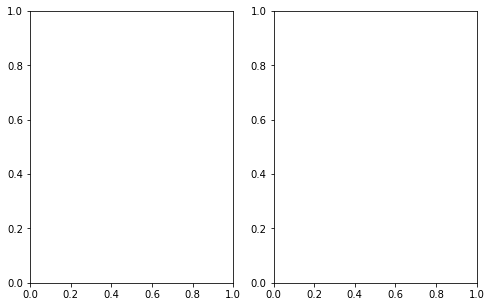

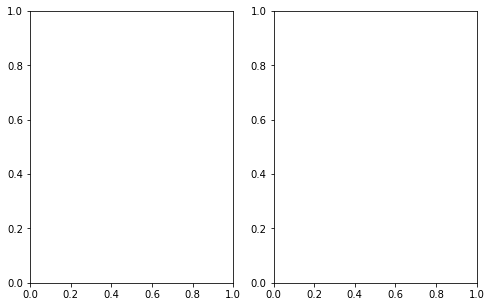

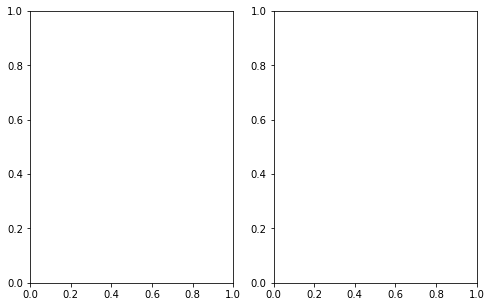

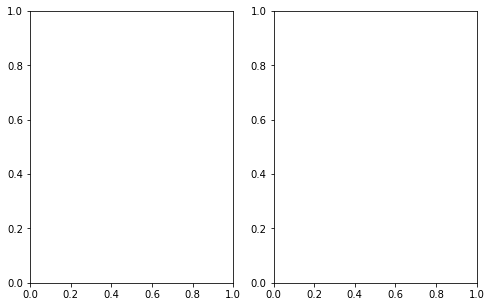

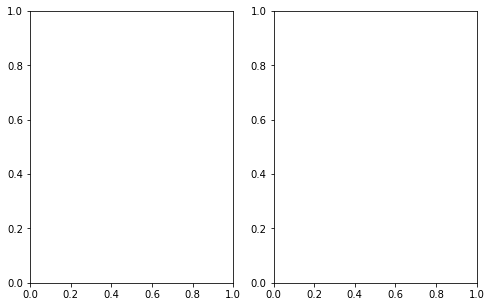

...

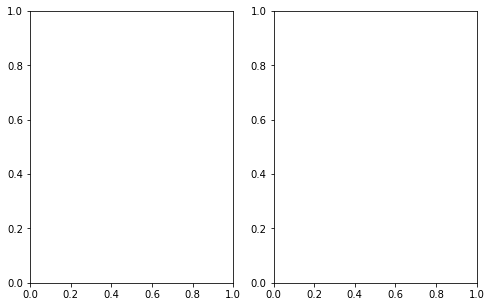

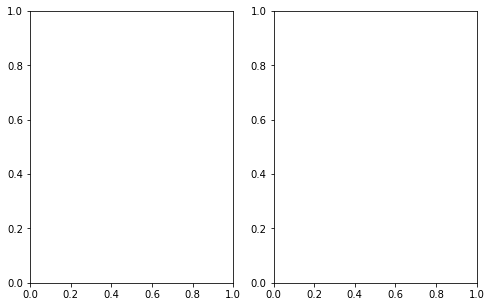

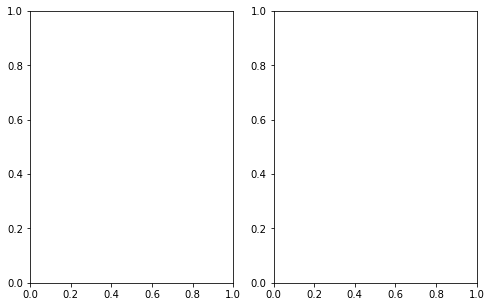

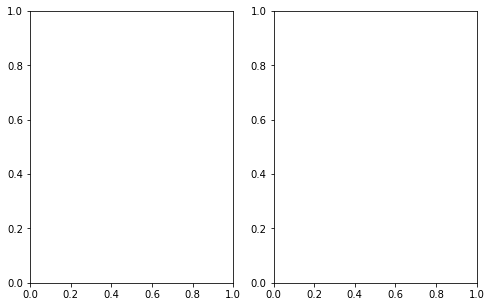

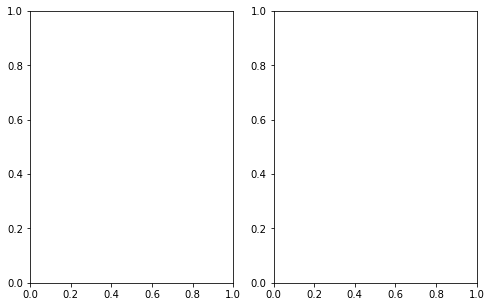

In [ ]:
for i, k in enumerate(filtered_trees_1_6):
    if k in trees_data_1_6:
        logging.debug('already processed {0}'.format(k))
        continue

    tree = filtered_trees_1_6[k]
    logging.debug('on key: {0}'.format(k))
    if i % 100 == 0:
        logging.info('({1} out of {2} done)'.format(k, i, len(filtered_trees_1_6)))

    if all_trees_mask_orientation_info.get(k, [1])[-1] > moments.ROUNDNESS_AR_CONVERSION['1_6']:
        logging.debug('skipping b/c {0} didn\'t make the base ~1:6 aspect ratio cut'.format(k))
        continue
    
    if tree.getTreeMaskedArea2D() > 20000:
        continue
    
    corners = tree.root_node.corners
    if (
        corners[1][0] > galfa_const.GALFA_Y_STEPS - 10 or 
        corners[1][1] > galfa_const.GALFA_X_STEPS - 10 or 
        corners[0][0] < 10 or 
        corners[0][1] < 10):
        logging.debug('skipping b/c {0} is too close to the edge'.format(k))
        continue 

    try:
        # 2d binary numpy mask
        tree_mask = tree.root_node.mask
        # number of pixels masked
        tree_size = tree.root_node.masked_area_size
        # velocity span in km/s from number of channels
        tree_v_span = tree.length * galfa_const.GALFA_W_SLICE_SEPARATION
        tree_starting_v_index = tree.root_v_slice

        # "average velocity" use mean/med/max of moment 1 map instead
        tree_avg_v = galfa_util.galfa_v_lookup_from_index(tree_starting_v_index + tree_v_span / 2.)

        # centroid and roundness measurement of the mask
        x_bar, y_bar, theta_1, theta_2, tree_roundness = all_trees_mask_orientation_info.get(k, [np.inf] * 5)
        # conversion of the centroid index into ra&dec and l&b
        tree_ra, tree_dec = galfa_util.galfa_index_to_radecs(x_bar, y_bar)
        tree_l, tree_b = galfa_util.galfa_index_to_lb(x_bar, y_bar)
        # convert the corners into ra&dec
        xs = [tree.root_node.corners[0][1], tree.root_node.corners[1][1]]
        ys = [tree.root_node.corners[0][0], tree.root_node.corners[1][0]]
        corners_ra, corners_dec = galfa_util.galfa_index_to_radecs(xs, ys)    

        # list of cut umask slices
        tree_data_cube = galfa_util.get_galfa_data_cube_from_tree(tree)
        # list of cut raw slices
        tree_data_cube_raw = galfa_util.get_galfa_data_cube_from_tree(tree, cube_type='raw')

        # moment 0 from the umask slices
        full_moment_0_map = np.nan_to_num(cube_moments.moment_0_from_cube(tree_data_cube))
        # moment 0 from the raw slices
        full_moment_0_map_raw_no_umask = np.nan_to_num(cube_moments.moment_0_from_cube(tree_data_cube_raw))
        # unsharp masking the moment 0 from the raw slices
        full_moment_0_map_raw_umask = cube_util.umask(full_moment_0_map_raw_no_umask, radius=30, filter_opt='gaussian')

        # moment 0, 1, 2, column maps with pixels not in the mask NaN'd out
        moment_0_map = cube_moments.moment_0_from_cube(tree_data_cube, mask=tree_mask)
        moment_0_map_raw = full_moment_0_map_raw_umask.copy()
        moment_0_map_raw_no_umask = full_moment_0_map_raw_no_umask.copy()
        moment_0_map_raw[np.where(tree_mask == 0)] = np.nan
        moment_0_map_raw_no_umask[np.where(tree_mask == 0)] = np.nan
        moment_1_map = cube_moments.moment_1_from_cube(tree_data_cube, tree_starting_v_index, tree.length, mask=tree_mask)
        moment_2_map = cube_moments.moment_2_from_cube(tree_data_cube, tree_starting_v_index, tree.length, mask=tree_mask)
        column_density_map = cube_moments.column_density_from_moment_0_map(moment_0_map)
        column_density_map_raw = cube_moments.column_density_from_moment_0_map(moment_0_map_raw)
        column_density_map_raw_no_umask = cube_moments.column_density_from_moment_0_map(moment_0_map_raw_no_umask)

        # width fits, errors, and chisq from both the (umask-->moment0) and the (raw-->moment0-->umask) moment0s
        width_fit, width_fit_err, chisq = widths.get_width_fit_filfind(full_moment_0_map, tree, hdr)
        width_fit_raw, width_fit_err_raw, chisq_raw = widths.get_width_fit_filfind(full_moment_0_map_raw_umask, tree, hdr)
        width_fit_raw_no_umask, width_fit_err_raw_no_umask, chisq_raw_no_umask = widths.get_width_fit_filfind(full_moment_0_map_raw_no_umask, tree, hdr)

        tree_data = {}
        tree_data['key_num'] = i
        tree_data['roundness'] = tree_roundness
        tree_data['size'] = tree_size
        tree_data['ra'] = tree_ra
        tree_data['dec'] = tree_dec
        tree_data['l'] = tree_l
        tree_data['b'] = tree_b
        tree_data['velocity_span'] = tree_v_span
        tree_data['starting_velocity'] = galfa_util.galfa_v_lookup_from_index(tree.root_v_slice)
        tree_data['average_velocity'] = tree_avg_v
        tree_data['moment_0_peak'] = np.nanmax(moment_0_map)
        tree_data['moment_0_peak_raw']= np.nanmax(moment_0_map_raw)
        tree_data['moment_0_peak_raw_no_umask']= np.nanmax(moment_0_map_raw_no_umask)
        tree_data['moment_0_mean'] = np.nanmean(moment_0_map)
        tree_data['moment_0_mean_raw']= np.nanmean(moment_0_map_raw)
        tree_data['moment_0_mean_raw_no_umask']= np.nanmean(moment_0_map_raw_no_umask)
        tree_data['moment_0_median'] = np.nanmedian(moment_0_map)
        tree_data['moment_0_median_raw']= np.nanmedian(moment_0_map_raw)
        tree_data['moment_0_median_raw_no_umask']= np.nanmedian(moment_0_map_raw_no_umask)
        tree_data['moment_1_mean'] = np.nanmean(moment_1_map)
        tree_data['moment_1_median'] = np.nanmedian(moment_1_map)
        tree_data['moment_2_peak'] = np.nanmax(moment_2_map)
        tree_data['moment_2_mean'] = np.nanmean(moment_2_map)
        tree_data['moment_2_median'] = np.nanmedian(moment_2_map)
        tree_data['column_density_peak'] = np.nanmax(column_density_map)
        tree_data['column_density_peak_raw'] = np.nanmax(column_density_map_raw)
        tree_data['column_density_peak_raw_no_umask'] = np.nanmax(column_density_map_raw_no_umask)
        tree_data['column_density_mean'] = np.nanmean(column_density_map)
        tree_data['column_density_mean_raw'] = np.nanmean(column_density_map_raw)
        tree_data['column_density_mean_raw_no_umask'] = np.nanmean(column_density_map_raw_no_umask)
        tree_data['column_density_median'] = np.nanmedian(column_density_map)
        tree_data['column_density_median_raw'] = np.nanmedian(column_density_map_raw)
        tree_data['column_density_median_raw_no_umask'] = np.nanmedian(column_density_map_raw_no_umask)
        tree_data['width_fit'] = width_fit
        tree_data['width_fit_raw'] = width_fit_raw
        tree_data['width_fit_raw_no_umask'] = width_fit_raw_no_umask
        tree_data['width_err'] = width_fit_err
        tree_data['width_err_raw'] = width_fit_err_raw
        tree_data['width_err_raw_no_umask'] = width_fit_err_raw_no_umask
        tree_data['width_chisq'] = chisq
        tree_data['width_chisq_raw'] = chisq_raw
        tree_data['width_chisq_raw_no_umask'] = chisq_raw_no_umask

        trees_data_1_6[k] = tree_data

        if do_column_plots:
            fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(8,5))

            maps = [column_density_map, full_moment_0_map_raw_umask]
            for i, ax, in enumerate([ax1, ax2]):
                cutoff = np.percentile(maps[i], 5)
                cutoff2 = np.percentile(maps[i], 95)
                im = ax.imshow(maps[i].clip(cutoff, cutoff2), origin='lower', cmap='binary') #imshow does m by n
                ax.contour(tree_mask, alpha=.5, colors='red', linewidths=.1)

                ax.set_xticks([0, tree.root_node.corners[1][1]-tree.root_node.corners[0][1]])
                ax.set_xticklabels(np.round(corners_ra,2))
                ax.set_yticks([0, tree.root_node.corners[1][0]-tree.root_node.corners[0][0]])
                ax.set_yticklabels(np.round(corners_dec,2))
                ax.set_xlabel('RA')
                ax.set_ylabel('DEC')

                if i == 0:
                    ax.set_title('column from umask30')
                elif i == 1:
                    ax.set_title('raw moment 0 (w/ unsharp mask)')
                fig.colorbar(im, ax=ax, shrink=.8)


            fig.suptitle('{0} ({1} channels)'.format(k, tree.length))
            fig.tight_layout()

            if tree_roundness <= moments.ROUNDNESS_AR_CONVERSION['1_12']:
                save_path = '../../vis/column_plots_fifth_batch/1_12/{0}.pdf'.format(k)
            elif tree_roundness <= moments.ROUNDNESS_AR_CONVERSION['1_10']:
                save_path = '../../vis/column_plots_fifth_batch/1_10/{0}.pdf'.format(k)
            elif tree_roundness <= moments.ROUNDNESS_AR_CONVERSION['1_8']:
                save_path = '../../vis/column_plots_fifth_batch/1_8/{0}.pdf'.format(k)
            else:
                save_path = '../../vis/column_plots_fifth_batch/1_6/{0}.pdf'.format(k)

            logging.debug('saving figure at {0}'.format(save_path))
            fig.savefig(save_path)
            fig.clf()
            plt.close()
            plt.close('all')
    except:
        logging.error('failed to calc key: {0}'.format(k))

In [31]:
len(filtered_trees_1_6)

3496

In [32]:
len(trees_data_1_6)

3395

In [3]:
trees_data_1_6_pickle = '../../pickled_dicts/fifth_batch/trees_data_1_6_small_v2.p'

In [30]:
# pickle.dump(trees_data_1_6, open(trees_data_1_6_pickle, 'wb'))

In [4]:
with open(trees_data_1_6_pickle, 'rb') as f:
    trees_data_1_6 = pickle.load(f)

### format to csv

In [5]:
import pandas as pd
import pprint

In [9]:
reformatted_data = []
for k, v in trees_data_1_6.items():
    row = v.copy()
    if len(row) == 0:
        continue
    row['id'] = k
    reformatted_data.append(row)

In [12]:
df = pd.DataFrame(reformatted_data)

In [13]:
df.drop('key_num', axis=1, inplace=True)

In [15]:
df['roundness_converted_mask_aspect_ratio'] = ''
for k in ['1_6', '1_8', '1_9', '1_10', '1_11', '1_12', '1_13', '1_14']:
    v = moments.ROUNDNESS_AR_CONVERSION[k]
    df.loc[df.roundness <= v, 'roundness_converted_mask_aspect_ratio'] = k.replace('_', ':')

In [16]:
df[['roundness', 'roundness_converted_mask_aspect_ratio']].head()

,roundness,roundness_converted_mask_aspect_ratio
0,0.009428,1:10
1,0.024929,1:6
2,0.026188,1:6
3,0.026097,1:6
4,0.025369,1:6


In [17]:
df.to_csv('../../data_out/fifth_batch_all_prop_v2.csv', index=False)